#### <span style="color:red"><b>ATTENTION :</b></span> 
* Double check the size of this notebook **before** to commit on GitHub
* "Clear All Outputs" if needed (I suspect plotly to keep too much data)
* `Get-ChildItem ./ -recurse | where-object {$_.length -gt 100000000} | Sort-Object length | ft fullname, length -auto`

#  Uber

# Preface

<p align="center">
<img src="./assets/ny.png" alt="drawing" width="800"/>
<p>


## Notes about specifications

* Read 
    * https://app.jedha.co/course/projects-unsupervised-machine-learning-ft/uber-pickups-ft

* Goals 
    * Make sure the driver are at the right place at the right time such that wating time for the user does not exceed <span style="color:orange"><b>5 to 7 minutes</b></span> 
    * Ideally app would recommend hot-zones in major cities to be in at any given time of day
    * Create an algorithm to find hot zones
    * Visualize results on a dashboard 

* Instructions 
    * Get the data
    * Focus on **New-York**
    * Use cluster coordinates to pin hot zones
        * pick-up locations can be gathered into different clusters. Use cluster coordinates to pin hot zones
    * Create maps with plotly
    * Start small then generalize
        * Pick one day and a given hour
        * **and then** start to generalize your approach

* Deliverables
  * Have a map with hot-zones (plotly)
  * At least describe hot-zones per day of week
  * Compare results with at least : K-Means and DBSCAN

## TODO & Ideas - TO BE COMMENTED

* Make a test with time_slot_len=6 
* fig.write_image(k_AssetsDir + "/img"+ "/K-Means.png") fonctionne tout simplement pas !!!
* Splitting the notebook to avoid size problems ?
* Silhouette graphe en couteau ?

* ~~wording : Replace bin by time slot~~
* ~~wording : Pickup can be a noun or an adjective, but never a verb. Pick up is a verb phrase, but should not be used as a noun.~~

* DBSCAN 
  * ~~metric = haversine car la terre est ronde et pas plate (enfin je crois)~~
  * ~~unité de epsilon~~
  * https://blog.stackademic.com/mastering-clustering-dbscan-a880566704bc
  * https://www.sefidian.com/2022/12/18/how-to-determine-epsilon-and-minpts-parameters-of-dbscan-clustering/
  
* ~~warning K-Means~~
  * ~~set OMP_NUM_THREADS=5~~
  * ~~Get-ChildItem Env:~~
  * ~~echo $env:OMP_NUM_THREADS~~


In [19]:
# prelude

# avoid warnings with K-Means : OpenMP (open multi processing) memory leaks under windows blablabla...
import platform
system = platform.system()
if system == "Windows":
  import os
  os.environ["OMP_NUM_THREADS"] = "2"
else:
  None

import numpy                as np
import pandas               as pd
import seaborn              as sns
import datetime
import plotly.express       as px
import matplotlib.pyplot    as plt
import plotly.graph_objects as go

from sklearn.impute             import SimpleImputer
from sklearn.cluster            import KMeans, DBSCAN
from sklearn.metrics            import silhouette_score
from sklearn.neighbors          import NearestNeighbors
from sklearn.preprocessing      import OneHotEncoder         

# -----------------------------------------------------------------------------
k_AssetsDir     = "assets/"
k_Gold          = 1.618         # gold number for ratio
k_Width         = 12
k_Height        = k_Width/k_Gold
k_WidthPx       = 1024
k_HeightPx      = k_WidthPx/k_Gold
k_random_state  = 0
k_subset_size   = 50_000  # size of the subset to speedup K-Means computing   
k_time_slot_len = 10      # length, in minutes, of each time slot  

In [20]:
# -----------------------------------------------------------------------------
def quick_View(df: pd.DataFrame) -> pd.DataFrame:

    """
    Generates a summary DataFrame for each column in the input DataFrame.

    This function analyzes each column in the given DataFrame and creates a summary that includes
    data type, number of null values, percentage of null values, number of non-null values, 
    number of distinct values, min and max values, outlier bounds (for numeric columns),
    and the frequency of distinct values.

    Args:
        df (pd.DataFrame): The input DataFrame to analyze.

    Returns:
        pd.DataFrame: A DataFrame containing the summary of each column from the input DataFrame. 
                      Each row in the resulting DataFrame represents a column from the input DataFrame
                      with the following information:
                      - "name": Column name
                      - "dtype": Data type of the column
                      - "# null": Number of null values
                      - "% null": Percentage of null values
                      - "# NOT null": Number of non-null values
                      - "distinct val": Number of distinct values
                      - "-3*sig": Lower bound for outliers (mean - 3*std) for numeric columns
                      - "min": Minimum value for numeric columns
                      - "max": Maximum value for numeric columns
                      - "+3*sig": Upper bound for outliers (mean + 3*std) for numeric columns
                      - "distinct val count": Dictionary of distinct value counts or top 10 values for object columns
    """

    summary_lst = []
  
    for col_name in df.columns:
        col_dtype               = df[col_name].dtype
        num_of_null             = df[col_name].isnull().sum()
        percent_of_null         = num_of_null/len(df)
        num_of_non_null         = df[col_name].notnull().sum()
        num_of_distinct_values  = df[col_name].nunique()

        if num_of_distinct_values <= 10:
            distinct_values_counts = df[col_name].value_counts().to_dict()
        else:
            top_10_values_counts    = df[col_name].value_counts().head(10).to_dict()
            distinct_values_counts  = {k: v for k, v in sorted(top_10_values_counts.items(), key=lambda item: item[1], reverse=True)}

        if col_dtype != "object":
            max_of_col = df[col_name].max()
            min_of_col = df[col_name].min()
            outlier_hi = df[col_name].mean() + 3*df[col_name].std()
            outlier_lo = df[col_name].mean() - 3*df[col_name].std()
        else:
            max_of_col = -1
            min_of_col =  1
            outlier_hi = -1
            outlier_lo =  1

        summary_lst.append({
            "name"                : col_name,
            "dtype"               : col_dtype,
            "# null"              : num_of_null,
            "% null"              : (100*percent_of_null).round(2),
            "# NOT null"          : num_of_non_null,
            "distinct val"        : num_of_distinct_values,
            "-3*sig"              : round(outlier_lo,2) ,
            "min"                 : round(min_of_col,2),
            "max"                 : round(max_of_col,2),
            "+3*sig"              : round(outlier_hi,2) ,
            "distinct val count"  : distinct_values_counts
        })

    df_tmp = pd.DataFrame(summary_lst)
    return df_tmp

# EDA (Exploratory Data Analysis)

## About the files available

* See ./assets sub-directory

In [21]:
df_tmp = pd.read_csv(f"assets/taxi-zone-lookup.csv", nrows=10)
display (df_tmp)



,LocationID,Borough,Zone
0,1,EWR,Newark Airport
1,2,Queens,Jamaica Bay
2,3,Bronx,Allerton/Pelham Gardens
3,4,Manhattan,Alphabet City
4,5,Staten Island,Arden Heights
5,6,Staten Island,Arrochar/Fort Wadsworth
6,7,Queens,Astoria
7,8,Queens,Astoria Park
8,9,Queens,Auburndale
9,10,Queens,Baisley Park


* With this file we could relate LocationID to geographical area 

In [22]:
df_tmp = pd.read_csv(f"assets/uber-raw-data-janjune-15.csv", nrows=10)
display (df_tmp)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90
5,B02617,2015-05-17 09:47:00,B02617,228
6,B02617,2015-05-17 09:47:00,B02617,7
7,B02617,2015-05-17 09:47:00,B02764,74
8,B02617,2015-05-17 09:47:00,B02617,249
9,B02617,2015-05-17 09:47:00,B02764,22


### <span style="color:orange"><b>Comments :</b></span>

* Using the locationID from the taxi look up table we could extend the content this DataFrame with Borough and Zone
* However, this DataFrame lack longitude and latitude
* We need both of them if we want a tool that helps to deliver services within a n min. timeframe
    * For example, it is not said if a zone within a borough can/should be consiederd as a "5 min" area
    * Even though, we would have to take into acount the traffic in order to estimate what is a 5 min zone at 1 PM vs a 5 min zone at 2 AM


In [23]:
df_tmp = pd.read_csv(f"assets/uber-raw-data-apr14.csv", nrows=5)
display (df_tmp)

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


### <span style="color:orange"><b>Comments :</b></span>

* We cannot use the column named `Base` since we cannot relate it to either a borough or a zone
* Indeed, as we can see in the 2015 file, a dispatching base number can be related to multiple affiliated base number and a an affiliated bas number can be related to multiple location id. 

### <span style="color:orange"><b>Consequences :</b></span>

For the reasons explained above, in the rest of this notebook :

* We <span style="color:red"><b>do not</b></span> use data from 2015
* We <span style="color:red"><b>do not</b></span> use the taxi zone look up
* In files from 2014, we drop the column "Base" and only keep ``date``, ``latitude`` and ``longitude``

## Building the dataset

In [24]:
def uber_preprocessor(df):
  df.columns = df.columns.str.lower()
  df.columns = df.columns.str.replace("/", "_")

  # df["base"] = df["base"].astype("category")
  df.drop(columns="base", inplace=True)

  df["date_time"] = pd.to_datetime(df["date_time"])     # dayfirst=True
  df["year"] = df["date_time"].dt.year
  df["month"] = df["date_time"].dt.month
  df["day"] = df["date_time"].dt.day
  df["weekday"] = df["date_time"].dt.weekday            # 0 monday, 1 tuesday...
  df["hour"] = df["date_time"].dt.hour
  df["minute"] = df["date_time"].dt.minute
  df.drop(columns="date_time", inplace=True)

  # may be we could drop hour and min. We will see how it goes 
  df["time_slot"] = (df["hour"]*60 + df["minute"])//k_time_slot_len
  # df.drop(columns="hour", inplace=True)
  # df.drop(columns="minute", inplace=True)

  return df

### Load data and features engineering

In [25]:
months = ["apr"]
# months = ["apr", "may", "jun", "jul", "aug", "sep"]            # uncomment/comment this line to take all the months available into account 

df = pd.DataFrame()
for month in months:
  df_tmp = pd.read_csv(f"assets/uber-raw-data-{month}14.csv")
  df = pd.concat([df, df_tmp])

df = uber_preprocessor(df)

# display(df.sort_values(by="time_slot", ascending=False))
display(df.head(10))

,lat,lon,year,month,day,weekday,hour,minute,time_slot
0,40.7690,-73.9549,2014,4,1,1,0,11,1
1,40.7267,-74.0345,2014,4,1,1,0,17,1
2,40.7316,-73.9873,2014,4,1,1,0,21,2
3,40.7588,-73.9776,2014,4,1,1,0,28,2
4,40.7594,-73.9722,2014,4,1,1,0,33,3
5,40.7383,-74.0403,2014,4,1,1,0,33,3
6,40.7223,-73.9887,2014,4,1,1,0,39,3
7,40.7620,-73.9790,2014,4,1,1,0,45,4
8,40.7524,-73.9960,2014,4,1,1,0,55,5
9,40.7575,-73.9846,2014,4,1,1,1,1,6


### Remove duplicates

In [26]:
print(f"Percentage of duplicates before cleaning : {(df.duplicated().sum()  / len(df)) * 100:.2f}%")
df.drop_duplicates(inplace=True)


Percentage of duplicates before cleaning : 1.41%


#### <span style="color:orange"><b>Comments :</b></span>

In the dataset :
* No more duplicates
* A ``time_slot`` is a group of ``k_time_slot_len`` minutes (see the value of ``k_time_slot_len`` in the ``prelude`` cell of this notebook)
    * The ``time_slot`` feature is an index indicating the ``time`` at which the observation took place.
    * In each day, from 00H00 to 23H29, there are $\frac{23*60+59}{\text {k-time-slot-len} }$ ``time_slots`` 
    * This feature might be useful later since the users are not willing to wait more that 5-7 minutes (the length of a time slot)  

## EDA on the featured dataset

In [27]:
print(f"The dataset consists of :")
print(f"\t{len(df.shape):>9_} dimensions")
print(f"\t{df.shape[0]:>9_} observations")
print(f"\t{df.shape[1]:>9_} features    ")

The dataset consists of :
	        2 dimensions
	  556_573 observations
	        9 features    


In [28]:
df_types = pd.DataFrame ({
  "types" : df.dtypes.value_counts()
})
df_types["as_%"] = (100 * df_types["types"]/df_types["types"].sum()).round(2)

display(df_types)

,types,as_%
int32,7,77.78
float64,2,22.22


In [29]:
# df.describe(include="all").T
# df.info()

df_tmp = quick_View(df)
display(df_tmp.sort_values(by="# null", ascending=False))                 

,name,dtype,# null,% null,# NOT null,distinct val,-3*sig,min,max,+3*sig,distinct val count
0,lat,float64,0,0.0,556573,4149,40.63,40.07,42.12,40.85,"{40.6449: 1651, 40.774: 1599, 40.7741: 1544, 4..."
1,lon,float64,0,0.0,556573,5621,-74.13,-74.77,-72.07,-73.83,"{-73.9888: 1659, -73.9918: 1573, -73.9919: 144..."
2,year,int32,0,0.0,556573,1,2014.00,2014.00,2014.00,2014.00,{2014: 556573}
3,month,int32,0,0.0,556573,1,4.00,4.00,4.00,4.00,{4: 556573}
4,day,int32,0,0.0,556573,30,-11.04,1.00,30.00,43.25,"{30: 35697, 4: 26339, 25: 24682, 26: 24556, 24..."
5,weekday,int32,0,0.0,556573,7,-2.60,0.00,6.00,8.33,"{2: 107072, 1: 89925, 4: 88956, 3: 83923, 5: 7..."
6,hour,int32,0,0.0,556573,24,-3.14,0.00,23.00,32.07,"{17: 44873, 18: 42422, 16: 41392, 19: 38363, 2..."
7,minute,int32,0,0.0,556573,60,-22.47,0.00,59.00,81.37,"{14: 9603, 45: 9581, 44: 9562, 15: 9546, 10: 9..."
8,time_slot,int32,0,0.0,556573,144,-16.41,0.00,143.00,194.99,"{103: 7692, 106: 7629, 102: 7548, 109: 7498, 1..."


### <span style="color:orange"><b>Comments :</b></span>
* 4.5 M observations when all months are loaded
    * 560k observations for april 2014
* 0 % of null
* outliers ($\bar{x}$ + 3 $\sigma$ ) are in  
    * latitude
    * longitude

### Outliers

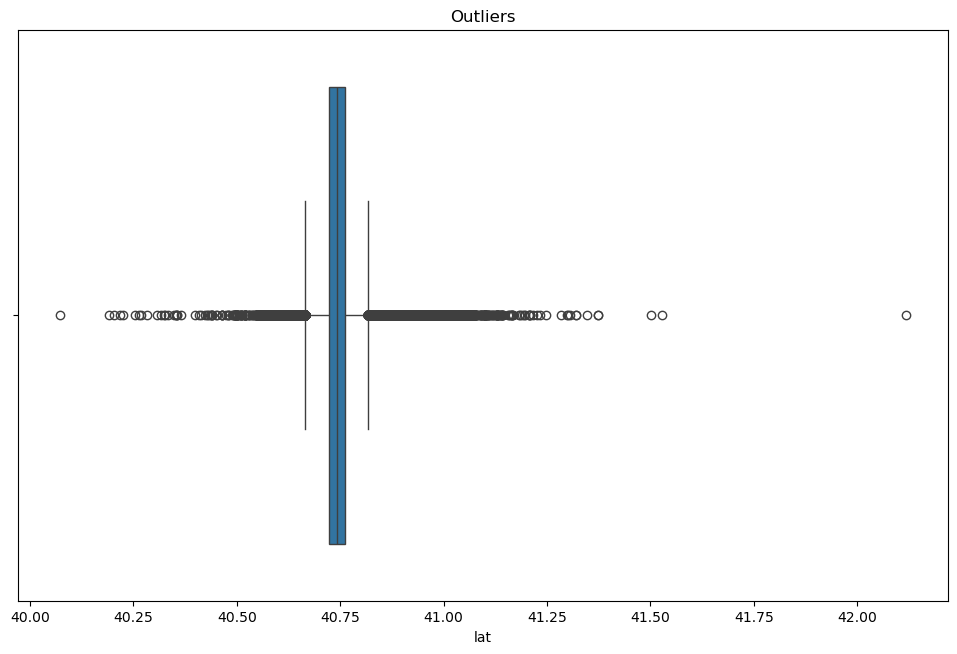

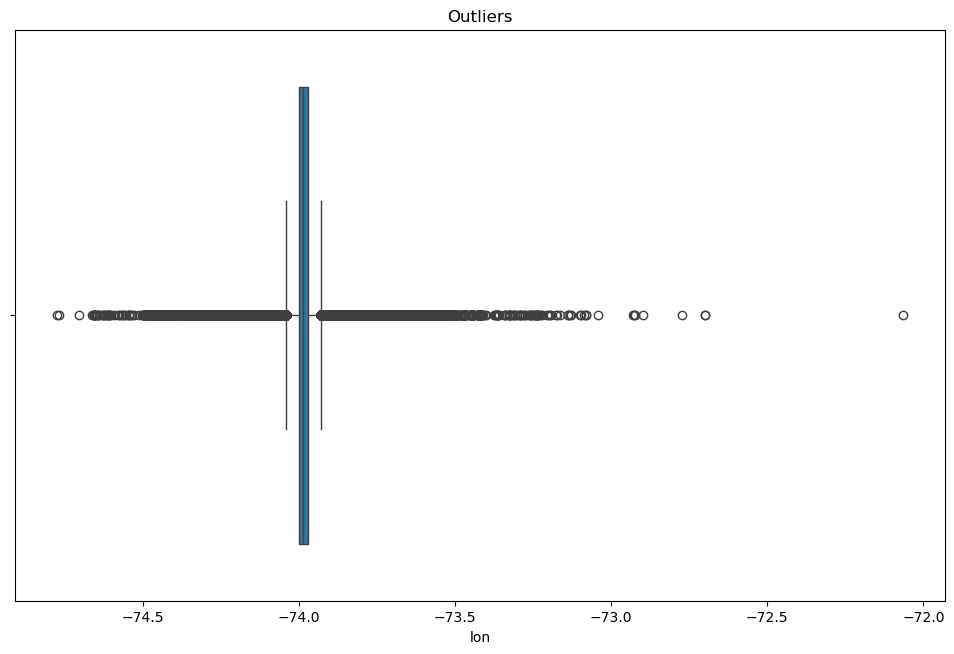

In [30]:
col_outliers = ["lat", "lon", ]

for col in col_outliers:
  # fig = px.box(df, y=col)
  # fig.show()
  # ! Plotly can't handle the whole dataset from april to sept 
  # Let's go back to an always working safe belt (seaborn) 
  fig, ax = plt.subplots(figsize=(k_Width, k_Height))
  sns.boxplot(df, x=col)
  ax.set_title("Outliers")


How many observations are considered as outliers ?

In [31]:
for col in col_outliers:
  upper_bound = df[col].mean() + 3*df[col].std()
  lower_bound = df[col].mean() - 3*df[col].std()
  nb_out = df.shape[0] - df[((df[col] >= lower_bound) & (df[col] <= upper_bound)) | df[col].isna()].shape[0]
  print(f"{col} have {nb_out:>6_} outliers ({100*nb_out/df.shape[0]:.2} %)")

lat have  6_630 outliers (1.2 %)
lon have 19_485 outliers (3.5 %)


#### <span style="color:orange"><b>Comments :</b></span>
* Since the percentage of outliers is low 
* In first approximation, we <span style="color:red"><b>remove</b></span> outliers from the dataset


In [32]:
# -----------------------------------------------------------------------------
def remove_Outliers_Sigma(df, column):
    mean_col = df[column].mean()
    sigma_col = df[column].std()

    lower_bound = mean_col - 3 * sigma_col
    upper_bound = mean_col + 3 * sigma_col
    df = df[((df[column] >= lower_bound) & (df[column] <= upper_bound)) | df[column].isna()]
    return df


In [33]:
print(f"Before outliers removal : {df.shape}")
for col in col_outliers:
    df = remove_Outliers_Sigma(df, col)
print(f"After  outliers removal : {df.shape}")

df_tmp = quick_View(df)
display(df_tmp.sort_values(by="# null", ascending=False))                 


Before outliers removal : (556573, 9)
After  outliers removal : (531235, 9)


,name,dtype,# null,% null,# NOT null,distinct val,-3*sig,min,max,+3*sig,distinct val count
0,lat,float64,0,0.0,531235,2160,40.66,40.63,40.85,40.83,"{40.774: 1594, 40.7741: 1542, 40.7388: 1264, 4..."
1,lon,float64,0,0.0,531235,2501,-74.06,-74.12,-73.84,-73.90,"{-73.9888: 1659, -73.9918: 1571, -73.9919: 144..."
2,year,int32,0,0.0,531235,1,2014.00,2014.00,2014.00,2014.00,{2014: 531235}
3,month,int32,0,0.0,531235,1,4.00,4.00,4.00,4.00,{4: 531235}
4,day,int32,0,0.0,531235,30,-11.08,1.00,30.00,43.29,"{30: 34642, 4: 25549, 25: 23733, 26: 23679, 24..."
5,weekday,int32,0,0.0,531235,7,-2.57,0.00,6.00,8.30,"{2: 102834, 1: 86064, 4: 85629, 3: 80443, 5: 7..."
6,hour,int32,0,0.0,531235,24,-3.12,0.00,23.00,32.07,"{17: 43310, 18: 40886, 16: 39676, 19: 36693, 2..."
7,minute,int32,0,0.0,531235,60,-22.47,0.00,59.00,81.38,"{14: 9199, 45: 9161, 44: 9135, 15: 9116, 10: 9..."
8,time_slot,int32,0,0.0,531235,144,-16.26,0.00,143.00,194.96,"{106: 7412, 103: 7399, 109: 7257, 102: 7211, 1..."


# Understanding the dataset

## Focus on one month

In [34]:
year      = 2014                                                   
month     = 4                                                      # select another month if needed (at least, the month must be in df)
day       = 9                                                      
hour      = 7

date_obj = datetime.datetime(year, month, day)                     # day is mandatory to create a date object but it is not yet used
date_string = date_obj.strftime("%Y-%B")

# print(date_string)
# print(date_obj.strftime('%A'))

In [35]:
df_full_month  = df[(df["month"] == month) & (df["year"] == year)] 

# ! Comment the next line if you want to take into account all the pick-up  
# plotly may be then slow or unable to display all the data
# some processings may take a while
df_month = df_full_month.sample(k_subset_size)

df_month.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,50000.0,40.741637,0.028016,40.632,40.7240,40.7435,40.7608,40.8480
lon,50000.0,-73.981137,0.026721,-74.119,-73.9978,-73.9854,-73.9719,-73.8362
year,50000.0,2014.000000,0.000000,2014.000,2014.0000,2014.0000,2014.0000,2014.0000
month,50000.0,4.000000,0.000000,4.000,4.0000,4.0000,4.0000,4.0000
day,50000.0,16.166480,9.054698,1.000,8.0000,16.0000,24.0000,30.0000
weekday,50000.0,2.859200,1.804905,0.000,1.0000,3.0000,4.0000,6.0000
hour,50000.0,14.482260,5.864846,0.000,10.0000,16.0000,19.0000,23.0000
minute,50000.0,29.347300,17.283729,0.000,14.0000,29.0000,44.0000,59.0000
time_slot,50000.0,89.381580,35.202347,0.000,63.0000,97.0000,117.0000,143.0000


#### <span style="color:orange"><b>Comments :</b></span>

* <span style="color:red"><b>ATTENTION :</b></span> Subset. To help Plotly and speed up the data processing, we use a sample of the pickups of the month of study  
* Double check the value of `count` in the table above


### Pickups during the month

In [36]:
fig = px.histogram(
  df_month, 
  x="day",
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"{date_string} - Pickups per day",
)
fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* The graph here above shows pickups per day during the month  
* It seems there is a kind of cycle along the weeks

### Breakdown of the pickups per day of the week

In [37]:
fig = px.histogram(
  df_month, 
  x="weekday", 
  height = k_HeightPx, 
  width = k_WidthPx,
  title = f"{date_string} - Pickups per day (0=Monday)",
)
fig.show()


#### <span style="color:orange"><b>Comments :</b></span>

* The weekly pattern is confirmed over the month


In [38]:
fig = px.histogram(
  df,                     # ! df NOT df_month
  x="weekday", 
  height = k_HeightPx, 
  width = k_WidthPx,
  title = "Apr-Sept 2014 - Pickups per day (0=Monday)",
)
fig.show()


#### <span style="color:orange"><b>Comments :</b></span>

* The weekly pattern is confirmed over the april-sept period of 2014
* Most active days of the week : Wenesday-Friday
* Least active days of the week : Sunday-Monday 
* <span style="color:orange"><b>Consequences :</b></span> 
    * Since the daily volume pattern is the same whatever the month 
    * This means that we will have to take the day of the week (monday, tuesday...) into account when looking for hot spots. 
    * Indeed, if on Wednesday there are twice as many pickups as on Monday, we can assume that the clusters will be of different density and distributed differently.  


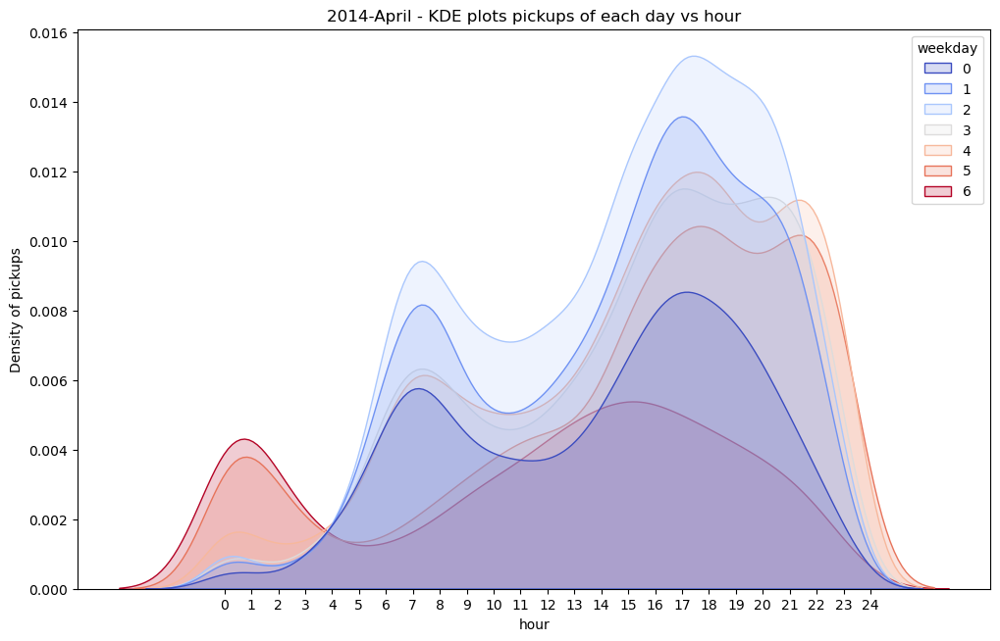

In [39]:
# Kernel density estimate (KDE) represents the data using a continuous probability density curve 

plt.figure(figsize=(k_Width, k_Height))
ax = sns.kdeplot(data = df_month, x = 'hour', fill = True, hue = 'weekday', palette = 'coolwarm', alpha = 0.2) 
ax.set_title(f"{date_string} - KDE plots pickups of each day vs hour")
ax.set_ylabel('Density of pickups')
ax.set_xticks([i for i in range(25)]) # using bw_adjust= low value ??? and cut=None does'nt work
plt.show()

#### <span style="color:orange"><b>Comments :</b></span>

* Saturday and Sunday show a pick of activities between 0 and 2AM
* Otherwise all the other days show 2 picks around 7AM and 6PM 
* The density helps to realize why friday (day 4) is so important : not only the peak in the afternoon is high but it is also very large 
* <span style="color:orange"><b>Consequence :</b></span> Since the hourly pattern depend on the day of the week (monday, tuesday...) we will have to take it into account when looking for hot spots. Indeed, hot spots at 1 AM saturday are, for sure, different than hot spots at 1 AM monday.

### Localization of the pickups during the month

In [40]:

# it is safer to sort the values to be used as an animation_frame 
df_month = df_month.sort_values(by= "day", ascending=True)

fig = px.density_mapbox(
  df_month,
  lat="lat",
  lon="lon",
  animation_frame='day', 
  mapbox_style="carto-positron",
  radius=3,
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title= f"{date_string} - Localized pickups per day over the selected month"
)
fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* The more pickups on one spot, the higher the "temperature" of the spot
* "temperature" obviously refers to the number of pickups in the day
* The view is per day along the month of study
* At this point there is no information about timing along the day
* In April 2014, 21 was a monday. We can "see" the previously identified pattern. Indeed 21 (monday) is "cooler" than 22 (tuesday) which is "cooler" than 23 (wednesday)

<p align="center">
<img src="./assets/hotspots.png" alt="drawing" width="800"/>
<p>


#### <span style="color:orange"><b>Comments :</b></span>

* No matter the day of the month, the areas here below are always on the top of the list : 
    * LaGuardia
    * Brooklyn
    * Greenpoint
    * Manhattan


### Localization of the pickups during the day (per hour, no matter the day)

In [41]:
# it is safer to sort the values to be used as an animation_frame 
df_month = df_month.sort_values(by= "hour", ascending=True)

fig = px.density_mapbox(
  df_month,
  lat="lat",
  lon="lon",
  animation_frame='hour', 
  mapbox_style="carto-positron",
  radius=3,
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title= f"{date_string} - Localized pickups per hour over the selected month"
)
fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* We look at all the days of the month at once
* We look how the pickups go per hour during an "average day"
* Brooklyn and LaGuardia slow down their pickups from 1AM to respectively 4 and 5AM
* On the other hand Manhattan and Greenpoint never stop their activites (<span style="color:orange"><b>NY, the city that never sleeps ?</b></span>)
* We must understand we <span style="color:red"><b>CANNOT</b></span> use these data to show to the drivers the spots. Indeed :
    * All days are considered equal and we know weekend != workday (for example)
    * The time resolution is not good enough. The data show were the pickups take place in the next hour while we need n-minute resolution 

## Focus on one weekday

* Monday, tuesday...

In [42]:
# remember the day is the n ith day of the month
# Earlier we add 
# year      = 2014                                                   
# month     = 4                                                      
# day       = 9                                                      
# hour      = 7

date_obj = datetime.datetime(year, month, day)
date_string = date_obj.strftime("%Y-%B-%a")          # https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior
# print (date_obj)
# print(date_obj.strftime("%A"))

In [25]:
df_weekday = df_month[df_month["weekday"]==date_obj.weekday()]
df_weekday.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,9722.0,40.744385,0.026400,40.6321,40.7269,40.7474,40.7619,40.8464
lon,9722.0,-73.981600,0.025470,-74.1054,-73.9972,-73.9850,-73.9729,-73.8355
year,9722.0,2014.000000,0.000000,2014.0000,2014.0000,2014.0000,2014.0000,2014.0000
month,9722.0,4.000000,0.000000,4.0000,4.0000,4.0000,4.0000,4.0000
day,9722.0,18.605740,10.376761,2.0000,9.0000,23.0000,30.0000,30.0000
weekday,9722.0,2.000000,0.000000,2.0000,2.0000,2.0000,2.0000,2.0000
hour,9722.0,14.499177,5.358503,0.0000,10.0000,16.0000,19.0000,23.0000
minute,9722.0,29.426250,17.323690,0.0000,14.0000,29.0000,44.7500,59.0000
time_slot,9722.0,89.488788,32.117524,0.0000,64.0000,96.0000,115.0000,143.0000


### Breakdown of the pickups over one weekday (hourly resolution)

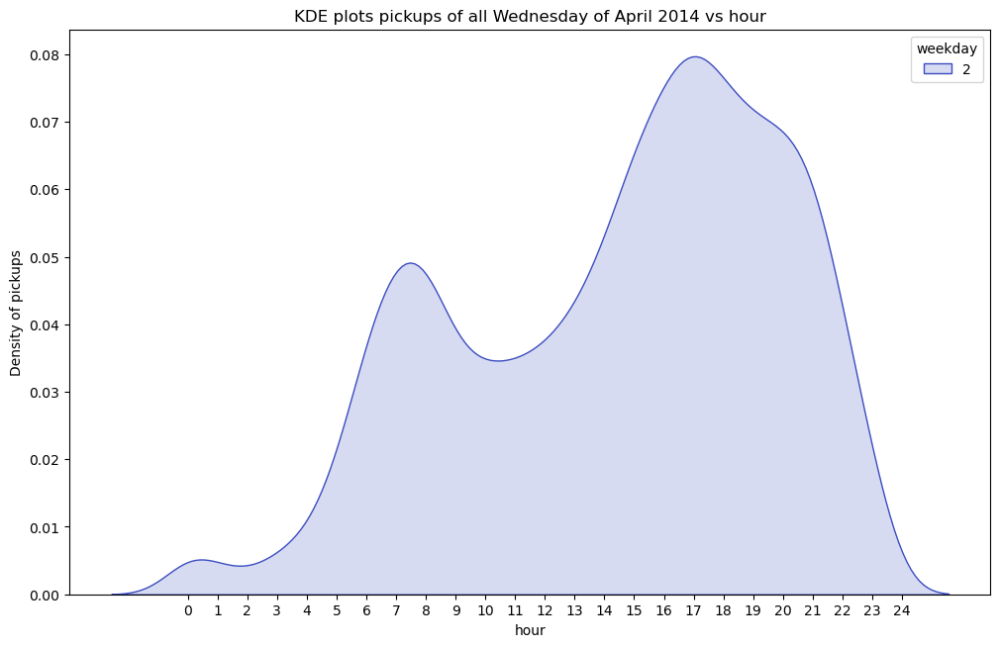

In [26]:
plt.figure(figsize=(k_Width, k_Height))
ax = sns.kdeplot(data = df_weekday, x = 'hour', fill = True, hue = 'weekday', palette = 'coolwarm', alpha = 0.2) 
ax.set_title(f"KDE plots pickups of all {date_obj.strftime('%A')} of {date_obj.strftime('%B %Y')} vs hour")
ax.set_ylabel('Density of pickups')
ax.set_xticks([i for i in range(25)]) # using bw_adjust= low value ??? and cut=None does'nt work
plt.show()

#### <span style="color:orange"><b>Comments :</b></span>

* This graph is consistent with the previous KDE plot

### Localization of the pickups over one weekday (hourly resolution)

In [27]:
# it is safer to sort the values to be used as an animation_frame 
df_weekday = df_weekday.sort_values(by= "hour", ascending=True)

fig = px.density_mapbox(
  df_weekday,
  lat="lat",
  lon="lon",
  animation_frame='hour', 
  mapbox_style="carto-positron",
  radius=5,
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title= f"Localized pickups for all {date_obj.strftime('%A')} of {date_obj.strftime('%B %Y')} during the next hour"
)

fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* Keep in mind that to help Plotly and speed up data processing, we work on a subset of the data.
* Bear in mind that the graph shows where the pickups will take place in the next hour for every hour of the day
* With some adjustment in zooming and panning, we can observe that at 6AM, the area of Soho (south Manhattan) and east and west side of the middle of Central Park "lite up" synchronously
* Then the center of Manhattan lites up
* Throughout the day, the “fire” spreads and covers the whole of Manhattan
* We can see where the peak of 6 PM takes place


### Localization of the pickups over one weekday (time slot resolution)

In [28]:
# it is safer to sort the values to be used as an animation_frame 
df_weekday = df_weekday.sort_values(by= "time_slot", ascending=True)

fig = px.density_mapbox(
  df_weekday,
  lat="lat",
  lon="lon",
  animation_frame='time_slot', 
  mapbox_style="carto-positron",
  radius=10,                          # ! radius changed from 3 to 10
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title= f"Localized pickups for all {date_obj.strftime('%A')} of {date_obj.strftime('%B %Y')} ({k_time_slot_len} minutes time resolution)",
)

fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* This is the same graph but with a higher time resolution
* Again, keep in mind that 
    * to help Plotly and speed up data processing, we work on a subset of the data
    * the graph shows where the pickups will take place within the next n minutes, for every time slot of the day. For the value of n see the value of ``k_time_slot`` in the prelude cell of this notebook or at the title of the graph


Let's make a try with a ``scatter_mapbox()`` instead of ``density_mapbox()``

In [29]:
fig = px.scatter_mapbox(
  df_weekday, 
  lat="lat", 
  lon="lon", 
  # opacity = 0.8,
  animation_frame='time_slot', 
  mapbox_style = "carto-positron",  
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"Localized pickups for all {date_obj.strftime('%A')} of {date_obj.strftime('%B %Y')} ({k_time_slot_len} minutes time resolution)",
)
fig.show()

### How do pick-up times and locations differ between Sunday and Monday?

In [30]:
df_sunday  = df_month[(df_month["weekday"] == 6) ] 

# it is safer to sort the values to be used as an animation_frame 
df_sunday = df_sunday.sort_values(by= "hour", ascending=True)

fig = px.density_mapbox(
  df_sunday,
  lat="lat",
  lon="lon",
  animation_frame='hour', 
  mapbox_style="carto-positron",
  radius=3,
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title= f"Localized pickups per hour over all the Sunday of {date_obj.strftime('%B %Y')}"
)
fig.show()

In [31]:
df_monday  = df_month[(df_month["weekday"] == 0)] 

# it is safer to sort the values to be used as an animation_frame 
df_monday = df_monday.sort_values(by= "hour", ascending=True)

fig = px.density_mapbox(
  df_monday,
  lat="lat",
  lon="lon",
  animation_frame='hour', 
  mapbox_style="carto-positron",
  radius=3,
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title= f"Localized pickups per hour over all Monday of {date_obj.strftime('%B %Y')}"
)
fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* At 0 AM we can "clearly see" how Sunday differs from Monday (whether people go out at night or not)
* Same thing at 6 AM or 7 AM (day off vs working day)
* This is consistent with the KDE graph used earlier
* <span style="color:orange"><b>Consequence :</b></span> we should understand that the clusters are ``weekday`` and ``hour`` dependant

## Focus on one hour from one specific ``weekday``

* Since the pattern is `weekday` dependant
* We look at the same hour for all the same `weekday` of the same month

In [32]:
date_obj = datetime.datetime(year, month, day, hour)
date_string = date_obj.strftime("%Y-%B-%a-%HH") # https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior
print(date_string)

2014-April-Wed-07H


In [33]:
df_hour = df_weekday[df_weekday["hour"]==hour]
df_hour.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,507.0,40.745798,0.030184,40.6512,40.72705,40.7441,40.7708,40.8257
lon,507.0,-73.979417,0.025505,-74.0820,-73.99515,-73.9829,-73.9632,-73.8624
year,507.0,2014.000000,0.000000,2014.0000,2014.00000,2014.0000,2014.0000,2014.0000
month,507.0,4.000000,0.000000,4.0000,4.00000,4.0000,4.0000,4.0000
day,507.0,16.455621,10.492398,2.0000,9.00000,16.0000,30.0000,30.0000
weekday,507.0,2.000000,0.000000,2.0000,2.00000,2.0000,2.0000,2.0000
hour,507.0,7.000000,0.000000,7.0000,7.00000,7.0000,7.0000,7.0000
minute,507.0,29.506903,17.145433,0.0000,15.00000,29.0000,45.0000,59.0000
time_slot,507.0,44.508876,1.694393,42.0000,43.00000,44.0000,46.0000,47.0000


In [34]:
fig = px.scatter_mapbox(
  df_hour, 
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
  mapbox_style = "carto-positron",  
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"Localized pickups for all {date_obj.strftime('%A')} of {date_obj.strftime('%B %Y')} at {date_obj.strftime('%H')}H during the next hour",
)
fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* At this time of the day (7AM) we can see that : 
    * LaGuardia   
    * East and west side of central park
    * South Manhattan & Greenpoint

are up and running

* Brooklyn is waking up


## Focus on a n-minute time slot from one specific ``weekday``

In [35]:
# it is safer to sort the values to be used as an animation_frame 
df_hour = df_hour.sort_values(by= "time_slot", ascending=True)

fig = px.scatter_mapbox(
  df_hour, 
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
  animation_frame='time_slot', 
  mapbox_style = "carto-positron",  
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"Localized pickups for all {date_obj.strftime('%A')} of the dataset at {date_obj.strftime('%H')}H during the next hour with {k_time_slot_len} minutes resolution",
)
fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* The display of the pickups in n-minute batches between 7am and 8am seems difficult to interpret
* This might be due to the fact that, in order to help Plotly and speed up data processing, we work on a subset of the data

## Focus on a n-minute time slot from  one specific ``weekday`` of the initial dataset

* The idea is to increase the number of observations so
    * From the initial dataset...
    * Over at most, one year period...
    * We select observations from the same weekday at the same hour

In [36]:
df_all_same_weekday_same_hour  = df[(df["weekday"] == date_obj.weekday()) & (df["year"] == year) & (df["hour"]==hour)] 
df_all_same_weekday_same_hour.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,5404.0,40.746264,0.029288,40.6324,40.7271,40.7457,40.7706,40.8479
lon,5404.0,-73.978839,0.024402,-74.1039,-73.9946,-73.9822,-73.9641,-73.8358
year,5404.0,2014.000000,0.000000,2014.0000,2014.0000,2014.0000,2014.0000,2014.0000
month,5404.0,4.000000,0.000000,4.0000,4.0000,4.0000,4.0000,4.0000
day,5404.0,16.948187,10.356548,2.0000,9.0000,16.0000,30.0000,30.0000
weekday,5404.0,2.000000,0.000000,2.0000,2.0000,2.0000,2.0000,2.0000
hour,5404.0,7.000000,0.000000,7.0000,7.0000,7.0000,7.0000,7.0000
minute,5404.0,29.820133,17.021870,0.0000,15.0000,30.0000,44.0000,59.0000
time_slot,5404.0,44.535159,1.679498,42.0000,43.0000,45.0000,46.0000,47.0000


In [37]:
# it is safer to sort the values to be used as an animation_frame 
df_all_same_weekday_same_hour = df_all_same_weekday_same_hour.sort_values(by= "time_slot", ascending=True)

fig = px.scatter_mapbox(
  df_all_same_weekday_same_hour, 
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
  animation_frame='time_slot', 
  mapbox_style = "carto-positron",  
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"Localized pickups for all {date_obj.strftime('%A')} at {date_obj.strftime('%H')}H during the next hour with {k_time_slot_len} minutes resolution",
)
fig.show()

#### <span style="color:orange"><b>Comments :</b></span>

* Compare to the previous graph, we now have 10 times more observations
* Even with 10-minute time slots it seems we can "see" some clusters
* We can groups observations this way because, thanks to the EDA, we now know the pickup are ``weekday`` dependant AND ``time`` dependant


# Identify clusters with `K-Means` and `DBScan` methods.

We start from where we are:
* a specific day of the week (wednesday for example)
* an hour (7 AM for example)
    
We want to identify the areas where a customer is likely to call in the next **10 minutes**.    


## K-Means

We're looking for the number **k** of clusters so that the clusters are spread out and have a high density. We'll use:

* **Elbow Method**:
    * We plot WCSS (Within-Cluster Sum of Squares) vs. **k**.
    * WCSS is defined as the sum for all cluster of squared distances between the centroids and each point.
    * We'll choose **k** such that adding an additional cluster no longer significantly improves the WCSS. This is typically represented as a bend or "elbow" in the WCSS curve when plotted against **k**.

* **Silhouette Score**:
    * The silhouette score measures the quality of the clustering, taking into account both 
        1. cohesion (how similar the points in the same cluster are) 
        1. separation (how distinct the clusters are from each other). 
    * It ranges from -1 to 1 where 
        1. a value close to 1 indicates that points are well-clustered and clearly separated from other clusters
        1. a value near 0 indicates that clusters are close to each other
        1. a negative value suggests that points may be incorrectly assigned. 
    
    * The optimal **k** maximizes the silhouette coefficient, meaning the clusters are well-formed (well-separated and compact).

* In practice, we select a **k** that is at the "elbow" in the WCSS curve and also corresponds to a high silhouette coefficient.
* The silhouette coefficient is a measure that evaluates the quality of clustering, taking into account both cohesion (how similar the points in the same cluster are) and separation (how distinct the clusters are from each other).
 
 


In [38]:
# At this stage the 7AM is still hardcoded as 42 (42 = 7 * 60/10 + 0 minutes)
# First let's make a copy of the features of interrest
df_for_kmeans = df_all_same_weekday_same_hour[["lat", "lon", "time_slot"]]
# filter and only keep the observations for the next 10 minutes after 7AM
df_for_kmeans = df_for_kmeans[df_for_kmeans["time_slot"]==42]
df_for_kmeans.drop(columns="time_slot", inplace=True)
df_for_kmeans.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,820.0,40.746056,0.031033,40.6378,40.725775,40.74620,40.771325,40.8439
lon,820.0,-73.978750,0.025527,-74.0936,-73.994900,-73.98235,-73.963150,-73.8402


In [39]:
fig = px.scatter_mapbox(
  df_for_kmeans, 
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
  mapbox_style = "carto-positron",  
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"Localized pickups {date_obj.strftime('%A')} at {date_obj.strftime('%H')}H during the next {k_time_slot_len} minutes",
)
fig.show()

Draw wcss and slihouette graph

In [40]:
wcss = []
sil=[]
k=[]
for i in range(2, 20): # Z! 2 to 11
  kmeans = KMeans(n_clusters=i, random_state = k_random_state, n_init='auto') # default init='k-means++', n_init='auto' avoid warning
  kmeans.fit(df_for_kmeans)
  wcss.append(kmeans.inertia_)
  sil.append(silhouette_score(df_for_kmeans, kmeans.predict(df_for_kmeans)))
  k.append(i)

df_for_k_choice = pd.DataFrame({'k':k, 'wcss':wcss, 'sil':sil}).set_index('k')

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=df_for_k_choice.index,
        y=df_for_k_choice['wcss'],
        mode='lines+markers',
        name='WCSS',             # Ajout du nom dans la légende
        line=dict(color='blue')  # couleur pour la ligne
    )
)

fig.add_trace(
    go.Bar(
        x=df_for_k_choice.index,
        y=df_for_k_choice['sil'],
        name='Silhouette Score',
        yaxis='y2',
        opacity=0.6
    )
)

fig.update_layout(
    title_text=f"{date_string} - KMEANS - Determine optimal # of clusters (k)",
    xaxis_title="k",
    yaxis=dict(
        title="WCSS",
    ),
    yaxis2=dict(
        title="Silhouette Score",
        overlaying='y',
        side='right'
    ),
    height=k_HeightPx,
    width=k_WidthPx,
)

fig.show()


* We choose k that lies at the elbow of the WCSS curve and also corresponds to a high value of the silhouette coefficient. 
* We select k = 10 
* We don't select k=8 because Silhouette score is lower 
* We don't select k=11 because the WCSS doesn't decrease significantly when k goes from 10 to 11.

In [41]:
df_with_kmeans_clusters = df_all_same_weekday_same_hour[["lat", "lon", "time_slot"]]
df_with_kmeans_clusters = df_with_kmeans_clusters[df_with_kmeans_clusters["time_slot"]==42]
df_with_kmeans_clusters.drop(columns="time_slot", inplace=True)

k_optimal = 10
kmeans = KMeans(n_clusters=k_optimal, random_state = k_random_state, n_init='auto') # default init='k-means++', n_init='auto' avoid warning 
df_with_kmeans_clusters['cluster'] = kmeans.fit_predict(df_with_kmeans_clusters)


* Display les cluster in colors
* The black dots on the map are the centroids of the clusters

In [42]:
kmeans_centroids = pd.DataFrame(kmeans.cluster_centers_, columns=['lat', 'lon'])

# force "cluster" to be NOT interpreted as a float number 
df_with_kmeans_clusters['cluster'] = df_with_kmeans_clusters['cluster'].astype(str)


# df_with_kmeans_clusters = df_with_kmeans_clusters.sort_values(by= "time_slot", ascending=True)

fig = px.scatter_mapbox(
  df_with_kmeans_clusters, 
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
#   animation_frame='time_slot', 
  mapbox_style = "carto-positron",  
  color='cluster',
  color_discrete_sequence=px.colors.qualitative.Plotly,                             # Use a discrete color sequence : Plotly D3 Set1 Pastel1 Category10
  # color_discrete_sequence=['red', 'blue', 'green', 'purple', 'orange', 'black'],  # Custom color sequence
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"K-Means - Localized pickups {date_obj.strftime('%A')} at {date_obj.strftime('%H')}H within the next {k_time_slot_len} minutes"
)

# fig.add_trace(px.scatter_mapbox(
#     kmeans_centroids,
#     lat='lat',
#     lon='lon',
#     mapbox_style="carto-positron"
# ).data[0])

fig.add_trace(go.Scattermapbox(
    lat=kmeans_centroids['lat'],
    lon=kmeans_centroids['lon'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=10,           
        color='black',       
        opacity=0.8        
    ),
    name='Centroids'       
))

fig.show()

# Simply does NOT work
# conda install -c conda-forge python-kaleido
# fig.write_image(k_AssetsDir + "/img"+ "/K-Means.png")


### <span style="color:orange"><b>Comments :</b></span>
THE thing to understand is :
* Even if a cluster is very large (cluster 0, Manhattan for example)
* If the cab is in the cluster
* Then the density of the cluster (in terms of customers who will call) is such that the cab will be able to serve a customer in less than ``k_time_slot`` min.
* Example 
    * Large Manhattan cluster
    * The cab is on the south side
    * There may be a call from a customer on the north side of Manhattan that the cab won't be able to serve in less than 5 min...
    * <span style="color:orange"><b>BUT</b></span>, we are also sure that there will be a call from a customer in the SOUTH of Manhattan that the driver will be able to serve in less than 5 min.


### <span style="color:orange"><b>Comments :</b></span>


K-Means can be used to determine from which clusters a customer is likely to call in the next 10 minutes.

So we could imagine that the driver presses a button of an on an application. From that moment on, the application could :
1. finds the day of the week (`weekday`)
1. finds the time
1. invoque ``kmean.fit()`` 

However, this is where we reach one of the <span style="color:red"><b>limitations</b></span> of K-Means. Indeed, one have to <span style="color:red"><b>choose k</b></span> before the application can go on invoking ``kmeans.fit_predict()`` and display the clusters on a map. Yes we could automate one way or another the way to find optimal k. For example, this could be done using the slope of WCSS and checking how the Silhouette score evolve.



## DBSCAN

In [43]:
# At this stage the 7AM is still hardcoded as 42 (42 = 7 * 60/10 + 0 minutes)
# First let's make a copy of the features of interrest
df_for_dbscan = df_all_same_weekday_same_hour[["lat", "lon", "time_slot"]]
# filter and only keep the observations for the next 10 minutes after 7AM
df_for_dbscan = df_for_dbscan[df_for_dbscan["time_slot"]==42]
df_for_dbscan.drop(columns="time_slot", inplace=True)
df_for_dbscan.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,820.0,40.746056,0.031033,40.6378,40.725775,40.74620,40.771325,40.8439
lon,820.0,-73.978750,0.025527,-74.0936,-73.994900,-73.98235,-73.963150,-73.8402


In [44]:
fig = px.scatter_mapbox(
  df_for_dbscan, 
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
  mapbox_style = "carto-positron",  
#   color='cluster',
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"Localized pickups {date_obj.strftime('%A')} at {date_obj.strftime('%H')}H within the next {k_time_slot_len} minutes"
)
fig.show()

In [45]:

# ! Conversion radian
df_for_dbscan_rad = np.deg2rad(df_for_dbscan)
df_for_dbscan_rad.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,820.0,0.711153,0.000542,0.709263,0.710799,0.711155,0.711594,0.712861
lon,820.0,-1.291173,0.000446,-1.293177,-1.291455,-1.291236,-1.290900,-1.288755


In [46]:
# df_for_dbscan = np.deg2rad(df_for_dbscan[["lat", "lon"]])
# df_for_dbscan.describe().T

In [47]:
# avg radius of Earth in kilometers
kms_per_radian = 6371.0088         

# pickups within 3 km
# epsilon = 3000/ kms_per_radian

epsilon = 0.0001 # in radian because lat and lon have been converted to radian (0.05 d° => 0.00087 rad)
                 # 0.0001 rad = 637 m
min_samples = 4  # heuristic 2 * number_of_dimensions => 2*2=4


# ! metric='haversine' => https://blog.stackademic.com/mastering-clustering-dbscan-a880566704bc
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric='haversine', algorithm="auto")       # algorithm='ball_tree', metric="euclidean"
dbscan.fit(df_for_dbscan_rad)                                                                     # Y a pas de predict

# df_hour_extended = df_hour.copy()
df_for_dbscan['cluster'] = dbscan.labels_

# df_tmp = pd.DataFrame(db.labels_)
# df_tmp[0].value_counts()

print(set(dbscan.labels_))
print(len(set(dbscan.labels_)))


{0, 1, 2, 3, 4, 5, -1}
7


In [48]:
# force "cluster" to be NOT interpreted as a float number 
df_for_dbscan['cluster'] = df_for_dbscan['cluster'].astype(str)

fig = px.scatter_mapbox(
  df_for_dbscan[df_for_dbscan['cluster']!="-1"],  # do not display anomalies
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
  mapbox_style = "carto-positron",  
  color='cluster',
  color_discrete_sequence=px.colors.qualitative.Plotly,                             # Use a discrete color sequence : Plotly D3 Set1 Pastel1 Category10
  # color_discrete_sequence=['red', 'blue', 'green', 'purple', 'orange', 'black'],  # Custom color sequence
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"DBSCAN - Localized pickups {date_obj.strftime('%A')} at {date_obj.strftime('%H')}H within the next {k_time_slot_len} minutes"
)
fig.show()

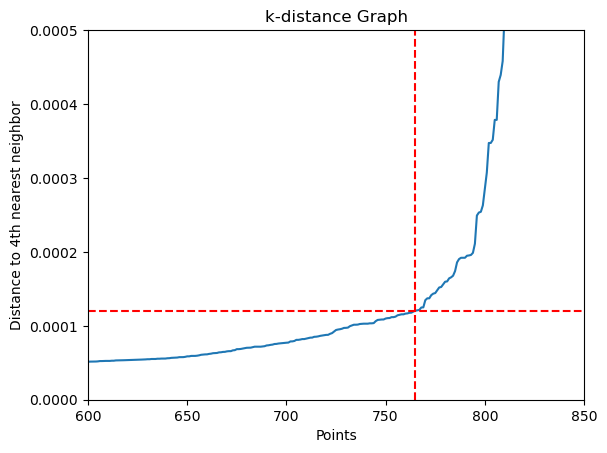

In [49]:

neigh = NearestNeighbors(n_neighbors=4)  
nbrs = neigh.fit(df_for_dbscan_rad)
distances, indices = nbrs.kneighbors(df_for_dbscan_rad)

# Sort distances by ascending order
distances = np.sort(distances[:, 3])  # 4th nearest neighbor

plt.plot(distances)
plt.xlabel('Points')
plt.ylabel('Distance to 4th nearest neighbor')
plt.title('k-distance Graph')

plt.ylim(0, 0.0005)
plt.xlim(600, 850)

xv = 765
yh = 0.00012
plt.axvline(x=xv, color='red', linestyle='--')
plt.axhline(y=yh, color='red', linestyle='--')

plt.show()

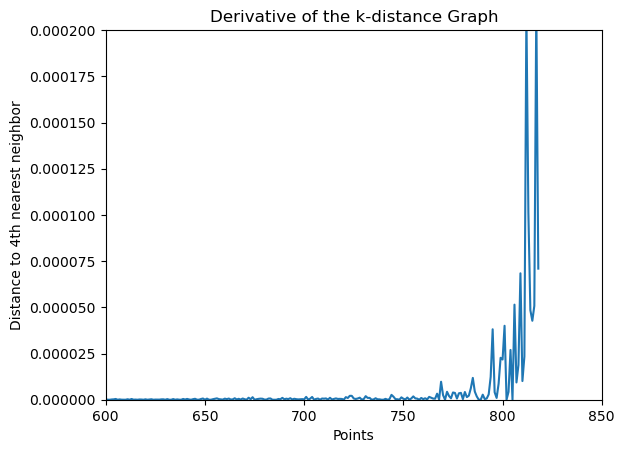

In [50]:
# print(distances)
derivative = [distances[i + 1] - distances[i] for i in range(len(distances) - 1)]
# print(differences)

plt.plot(derivative)
plt.xlabel('Points')
plt.ylabel('Distance to 4th nearest neighbor')
plt.title('Derivative of the k-distance Graph')

plt.ylim(0, 0.0002)
plt.xlim(600, 850)

plt.show()

# Driver application mock-up

In [160]:
year    = 2014
weekday = 0
time    = "07:30"

# weekday = 2
# time = "07:00"

# weekday = 0
# time = "01:00"



In [161]:
months = ["apr", "may", "jun", "jul", "aug", "sep"]            
week_days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
day_of_week = week_days[weekday]
hour, minute = map(float, time.split(":"))

df = pd.DataFrame()
for month in months:
  df_tmp = pd.read_csv(f"assets/uber-raw-data-{month}14.csv")
  df = pd.concat([df, df_tmp])

df = uber_preprocessor(df)
df.drop_duplicates(inplace=True)

col_outliers = ["lat", "lon"]
for col in col_outliers:
    df = remove_Outliers_Sigma(df, col)

df_tmp = quick_View(df)
display(df_tmp.sort_values(by="# null", ascending=False))                 


,name,dtype,# null,% null,# NOT null,distinct val,-3*sig,min,max,+3*sig,distinct val count
0,lat,float64,0,0.0,4221590,2390,40.65,40.62,40.86,40.83,"{40.774: 14644, 40.7741: 13503, 40.7739: 10486..."
1,lon,float64,0,0.0,4221590,3207,-74.07,-74.14,-73.81,-73.89,"{-73.9888: 12082, -73.9889: 11234, -73.9918: 1..."
2,year,int32,0,0.0,4221590,1,2014.00,2014.00,2014.00,2014.00,{2014: 4221590}
3,month,int32,0,0.0,4221590,6,1.70,4.00,9.00,11.94,"{9: 950257, 8: 765918, 7: 740545, 6: 618985, 5..."
4,day,int32,0,0.0,4221590,31,-10.29,1.00,31.00,42.16,"{30: 156692, 12: 150384, 16: 148682, 13: 14660..."
5,weekday,int32,0,0.0,4221590,7,-2.63,0.00,6.00,8.56,"{3: 708314, 4: 694435, 2: 653496, 1: 622041, 5..."
6,hour,int32,0,0.0,4221590,24,-3.65,0.00,23.00,32.07,"{17: 317076, 18: 305075, 16: 292987, 19: 27419..."
7,minute,int32,0,0.0,4221590,60,-22.56,0.00,59.00,81.36,"{10: 72488, 15: 71953, 14: 71887, 13: 71678, 1..."
8,time_slot,int32,0,0.0,4221590,144,-19.47,0.00,143.00,194.97,"{103: 54242, 109: 53718, 106: 53448, 108: 5291..."


In [162]:
df_all_same_weekday_same_hour  = df[(df["weekday"] == weekday) & (df["year"] == year) & (df["hour"]==hour) & (df["minute"]==minute)] 
# df_all_same_weekday_same_hour  = df[(df["weekday"] == weekday) & (df["year"] == year) & (df["hour"]==hour)] 
# df_all_same_weekday_same_hour.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,480.0,40.746537,0.030526,40.6468,40.727150,40.74745,40.770225,40.8487
lon,480.0,-73.976261,0.027677,-74.0735,-73.993225,-73.98140,-73.962100,-73.8318
year,480.0,2014.000000,0.000000,2014.0000,2014.000000,2014.00000,2014.000000,2014.0000
month,480.0,6.793750,1.737815,4.0000,6.000000,7.00000,8.250000,9.0000
day,480.0,16.677083,8.526386,1.0000,9.000000,16.00000,23.000000,30.0000
weekday,480.0,0.000000,0.000000,0.0000,0.000000,0.00000,0.000000,0.0000
hour,480.0,7.000000,0.000000,7.0000,7.000000,7.00000,7.000000,7.0000
minute,480.0,30.000000,0.000000,30.0000,30.000000,30.00000,30.000000,30.0000
time_slot,480.0,45.000000,0.000000,45.0000,45.000000,45.00000,45.000000,45.0000


In [163]:
df_for_kmeans = df_all_same_weekday_same_hour[["lat", "lon", "time_slot"]]
# filter and only keep the observations for the next 10 minutes after hour
df_for_kmeans = df_for_kmeans[df_for_kmeans["time_slot"]==(hour*60+minute)/k_time_slot_len]
df_for_kmeans.drop(columns="time_slot", inplace=True)
# df_for_kmeans.describe().T

,count,mean,std,min,25%,50%,75%,max
lat,480.0,40.746537,0.030526,40.6468,40.727150,40.74745,40.770225,40.8487
lon,480.0,-73.976261,0.027677,-74.0735,-73.993225,-73.98140,-73.962100,-73.8318


In [164]:
wcss = []
sil=[]
k=[]
for i in range(2, 20): # Z! 2 to 11
  kmeans = KMeans(n_clusters=i, random_state = k_random_state, n_init='auto') # default init='k-means++', n_init='auto' avoid warning
  kmeans.fit(df_for_kmeans)
  wcss.append(kmeans.inertia_)
  sil.append(silhouette_score(df_for_kmeans, kmeans.predict(df_for_kmeans)))
  k.append(i)

df_for_k_choice = pd.DataFrame({'k':k, 'wcss':wcss, 'sil':sil}).set_index('k')

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=df_for_k_choice.index,
        y=df_for_k_choice['wcss'],
        mode='lines+markers',
        name='WCSS',             # Ajout du nom dans la légende
        line=dict(color='blue')  # couleur pour la ligne
    )
)

fig.add_trace(
    go.Bar(
        x=df_for_k_choice.index,
        y=df_for_k_choice['sil'],
        name='Silhouette Score',
        yaxis='y2',
        opacity=0.6
    )
)

fig.update_layout(
    title_text=f"KMEANS - Determine optimal # of clusters (k)",
    xaxis_title="k",
    yaxis=dict(
        title="WCSS",
    ),
    yaxis2=dict(
        title="Silhouette Score",
        overlaying='y',
        side='right'
    ),
    height=k_HeightPx,
    width=k_WidthPx,
)

fig.show()


c:\Users\phili\anaconda3\envs\jedha\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\phili\anaconda3\envs\jedha\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\phili\anaconda3\envs\jedha\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.

c:\Users\phili\anaconda3\envs\jedha\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Window

In [171]:
k_optimal = 12

In [172]:
df_with_kmeans_clusters = df_all_same_weekday_same_hour[["lat", "lon", "time_slot"]]
df_with_kmeans_clusters = df_with_kmeans_clusters[df_with_kmeans_clusters["time_slot"]==(hour*60+minute)/k_time_slot_len]
df_with_kmeans_clusters.drop(columns="time_slot", inplace=True)

kmeans = KMeans(n_clusters=k_optimal, random_state = k_random_state, n_init='auto') # default init='k-means++', n_init='auto' avoid warning 
df_with_kmeans_clusters['cluster'] = kmeans.fit_predict(df_with_kmeans_clusters)


c:\Users\phili\anaconda3\envs\jedha\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.



In [173]:
kmeans_centroids = pd.DataFrame(kmeans.cluster_centers_, columns=['lat', 'lon'])

# force "cluster" to be NOT interpreted as a float number 
df_with_kmeans_clusters['cluster'] = df_with_kmeans_clusters['cluster'].astype(str)


# df_with_kmeans_clusters = df_with_kmeans_clusters.sort_values(by= "time_slot", ascending=True)

fig = px.scatter_mapbox(
  df_with_kmeans_clusters, 
  lat="lat", 
  lon="lon", 
  opacity = 0.5,
#   animation_frame='time_slot', 
  mapbox_style = "carto-positron",  
  color='cluster',
  color_discrete_sequence=px.colors.qualitative.Plotly,                             # Use a discrete color sequence : Plotly D3 Set1 Pastel1 Category10
  # color_discrete_sequence=['red', 'blue', 'green', 'purple', 'orange', 'black'],  # Custom color sequence
  zoom = 10.0,
  height = k_HeightPx,
  width = k_WidthPx,
  title = f"K-Means - Localized pickups {day_of_week} at {int(hour):02d}:{int(minute):02d} within the next {k_time_slot_len} minutes"
)

fig.add_trace(go.Scattermapbox(
    lat=kmeans_centroids['lat'],
    lon=kmeans_centroids['lon'],
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=10,           
        color='black',       
        opacity=0.8        
    ),
    name='Centroids'       
))

fig.show()

